## 1. Load Libraries

Import  Python packages.

For GPU runs, ensure CUDA is available.

In [1]:
import os
import sys
sys.path.append(os.path.abspath(".."))
import vapor
import scanpy as sc
import torch

# torch.cuda.set_per_process_memory_fraction(0.25, device=0)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

Using device: cuda


## 2. Load Data and Preprocess

### 2.1 Preprocessing requirements
**VAPOR expects gene expression to be normalized and scaled**.
- Normalize gene expression (library size normalization + log1p is common)
- Select highly variable genes (optional but recommended)
- Scale features for stable optimization

In [2]:
import scvelo as scv
# load adata
adata = scv.datasets.pancreas()

# QC + filtering (optional)
scv.pp.filter_genes(adata, min_shared_counts=20)

# normalize + log1p
scv.pp.normalize_per_cell(adata)
scv.pp.log1p(adata)

# HVG selection (optional)
sc.pp.highly_variable_genes(adata,n_top_genes=5000) 
adata = adata[:,adata.var['highly_variable']]

# scaling
sc.pp.scale(adata)

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


/tmp/ipykernel_159725/3532134384.py:7: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  scv.pp.log1p(adata)


### 2.2 PCA / UMAP: Initial Data Exploration

Before model training, we perform a low-dimensional embedding to obtain a coarse overview of the data structure and assess basic data quality.

This step enables:
- Inspect whether major cell populations or developmental stages are separable
- Check for obvious batch effects or technical artifacts

In [3]:
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

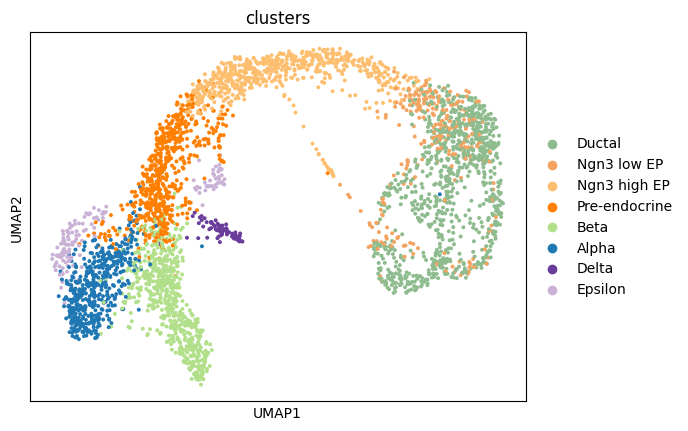

In [4]:
sc.pl.umap(adata,color='clusters')

## 3. Initialize Model and Train

### 3.1 Build Training Dataset

In [ ]:
dataset = vapor.dataset_from_adata(
    adata,
    root_indices=None,
    terminal_indices=None,
    scale=True,
)

### 3.2 Configure and Initialize Model

In [5]:
vapor.default_config()

VAPORConfig(time_label=None, root_indices=None, terminal_indices=None, scale=True, eps_z_k=30, graph_k=20, min_samples=5, spatial_key=None, batch_key=None, by_batch=True, eps_xy=None, zscore_mode='batch', expand_factor=1.25, eps_cap=3.0, latent_dim=64, n_dynamics=10, encoder_dims=[2048, 512, 128], decoder_dims=[128, 512, 2048], total_steps=1750, batch_size=512, lr=0.0003, device='cuda', beta=0.02, alpha=1.0, gamma=1.0, eta=1.0, tau=0.5, t_max=5, prune=False, grad_clip=0.2, print_freq=1, plot_losses=True)

In [6]:
model_config = vapor.config.VAPORConfig(
    lr = 1e-3,
    beta=0.01,
    eta=1.0,
    t_max=4,
)

model = vapor.initialize_model(
    input_dim=adata.n_vars,
    config=model_config
)

Initializing model:
  Input dim: 5000
  Latent dim: 64
  Encoder dims: [2048, 512, 128]
  Decoder dims: [128, 512, 2048]
  N dynamics: 10
0.5
No time label provided; proceeding without time supervision.
Data scaled per row.


### 3.3 Learning Rate Finder (Heuristic)

Empirically, the best learning rate can vary across datasets.  
This LR finder is a **heuristic** intended to provide a reasonable starting point.

**How to use the curve**
- A reasonable LR is often near the onset of loss divergence, or around a shallow minimum/plateau before divergence.
- Slightly smaller LR is usually safe.
- If no clear minimum/divergence appears, try increasing `num_steps` and/or widening `[lr_min, lr_max]`.

> This method is not yet fully robust and may be refined in future updates.

[LR Finder] step    0 | lr=1.00e-06 | smoothed_loss=2.004
[LR Finder] step   50 | lr=2.52e-06 | smoothed_loss=1.985
[LR Finder] step  100 | lr=6.33e-06 | smoothed_loss=1.923
[LR Finder] step  150 | lr=1.59e-05 | smoothed_loss=1.816
[LR Finder] step  200 | lr=4.01e-05 | smoothed_loss=1.681
[LR Finder] step  250 | lr=1.01e-04 | smoothed_loss=1.494
[LR Finder] step  300 | lr=2.54e-04 | smoothed_loss=1.203
[LR Finder] step  350 | lr=6.39e-04 | smoothed_loss=1.04
[LR Finder] step  400 | lr=1.61e-03 | smoothed_loss=0.9767
[LR Finder] step  450 | lr=4.05e-03 | smoothed_loss=0.959

[LR Finder] Done.
  lr_at_min_loss = 1.00e-02
  lr_at_diverge  = 1.00e-02 (diverged=False)
  suggested base_lr ≈ 5.00e-04  (rule: diverge/20)
Saved: lr_finder.png


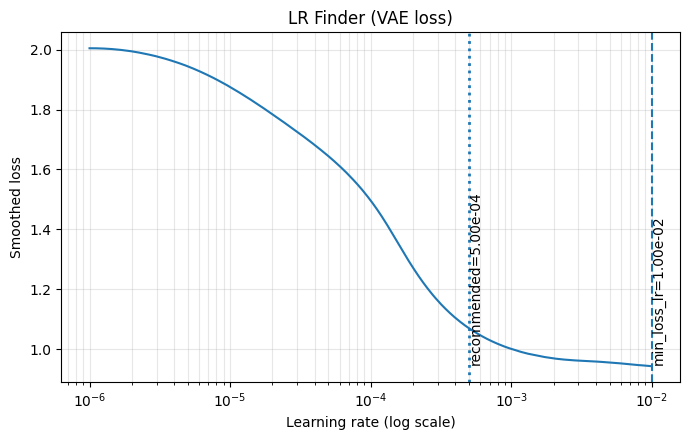

In [7]:
res = vapor.utils.lr_finder_vapor(
    model,
    dataset,
    beta = model_config.beta,
    batch_size = model_config.batch_size,
    num_steps = 500,
    lr_min = 1e-6,
    lr_max = 1e-2,
    device = device,
)

In [ ]:
# set model_config.lr = res.best_lr (or manually override)
model_config.lr=res.best_lr

### 3.4 Train Model

Training on device: cuda
Train / Test split:
  Total samples : 3696
  Train samples : 2957
  Test samples  : 739
  Test fraction : 0.200

Starting training...
--------------------------------------------------------------------------------
Training for 292 epochs with batch size 512
[WARN] config.by_batch=True but dataset has no batch_id. Likely you did not provide batch_key to dataset_from_adata(). Falling back to by_batch=False.
Epoch   1/292 | Time:  0.98s | Recon: 1.9911 | KL: 0.1263 | Traj: 1.8872 | Prior: 0.0000 | Psi: 0.9995
Epoch   2/292 | Time:  0.66s | Recon: 1.9639 | KL: 0.1263 | Traj: 1.8936 | Prior: 0.0000 | Psi: 0.9975
Epoch   3/292 | Time:  0.67s | Recon: 1.9377 | KL: 0.1262 | Traj: 1.8967 | Prior: 0.0000 | Psi: 0.9948
Epoch   4/292 | Time:  0.64s | Recon: 1.9139 | KL: 0.1263 | Traj: 1.8640 | Prior: 0.0000 | Psi: 0.9919
Epoch   5/292 | Time:  0.65s | Recon: 1.8921 | KL: 0.1263 | Traj: 1.8690 | Prior: 0.0000 | Psi: 0.9888
Epoch   6/292 | Time:  0.66s | Recon: 1.8721 | KL:

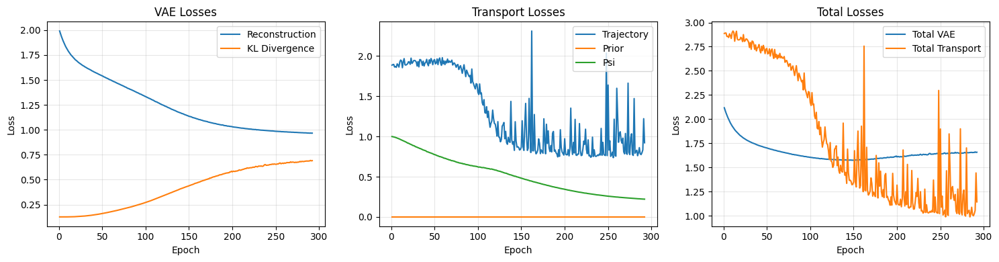

In [8]:
trained_model = vapor.train_model(
    model,
    dataset,
    config=model_config,
    verbose=True,
)

### 3.5 Save / Load Trained Model

In [9]:
SAVE_FILENAME="out/vapor_ckpt_pancreas.pt"

In [10]:
# save
vapor.utils.save_checkpoint(trained_model, model_config, SAVE_FILENAME)

In [11]:
# load
model = vapor.initialize_model(
    input_dim=adata.n_vars,
    config=model_config
)

trained_model, _ = vapor.utils.load_checkpoint(model, SAVE_FILENAME)

Initializing model:
  Input dim: 5000
  Latent dim: 64
  Encoder dims: [2048, 512, 128]
  Decoder dims: [128, 512, 2048]
  N dynamics: 10
0.5


## 4. Downstream Inference

### 4.1 Extract Latent Representations and Dynamics

In [12]:
adata_VAPOR = vapor.inference.extract_latents_and_dynamics(trained_model, adata, scale=True, device='cpu')

/home/ubuntu/VAPOR/vapor/inference.py:43: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  adata_vapor = ad.AnnData(np.array(z))
/home/ubuntu/VAPOR/vapor/inference.py:51: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  adata_vapor.layers[f'v_psi{i+1}'] = np.array(Uhat[:,i,:])
/home/ubuntu/VAPOR/vapor/inference.py:55: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword argume

- `scale=True` ensures that the input gene expression is scaled in the same way as during training, which is important for consistency between training and inference.
- Using `device="cpu"` is sufficient for inference on moderate-sized datasets and improves portability.
- The original cell metadata from `adata` are preserved in `adata_VAPOR`.

In [13]:
adata_VAPOR

AnnData object with n_obs × n_vars = 3696 × 64
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'pw_1', 'pw_2', 'pw_3', 'pw_4', 'pw_5', 'pw_6', 'pw_7', 'pw_8', 'pw_9', 'pw_10'
    uns: 'gene_names', 'n_dynamics'
    obsm: 'X_VAPOR'
    layers: 'v_psi1', 'v_psi2', 'v_psi3', 'v_psi4', 'v_psi5', 'v_psi6', 'v_psi7', 'v_psi8', 'v_psi9', 'v_psi10', 'v_VAPOR', 'vapor'

### 4.2 Visualization

[<Axes: title={'center': 'clusters'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'S_score'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'G2M_score'}, xlabel='UMAP1', ylabel='UMAP2'>]

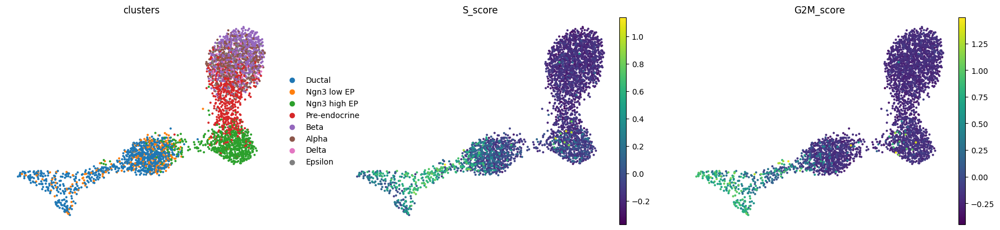

In [14]:
n_neighbors = 30
sc.pp.neighbors(adata_VAPOR, n_neighbors=n_neighbors, random_state=42, use_rep='X')
sc.tl.umap(adata_VAPOR)
sc.pl.embedding(adata_VAPOR, basis='umap', color=['clusters','S_score', 'G2M_score'], frameon=False, show=False)

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_VAPOR_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_VAPOR_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


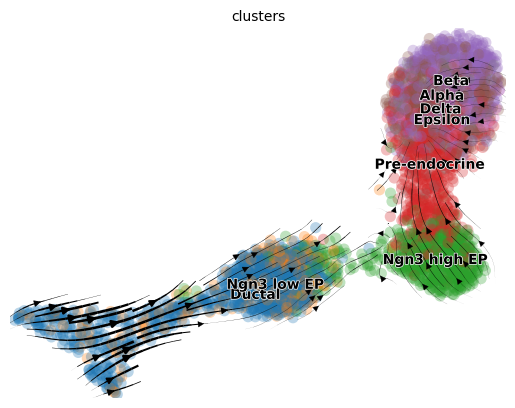

In [15]:
import scvelo as scv
sc.pp.neighbors(adata_VAPOR,use_rep='X_VAPOR', random_state=42, n_neighbors=n_neighbors)
scv.tl.velocity_graph(adata_VAPOR, vkey='v_VAPOR', xkey='vapor')
scv.pl.velocity_embedding_stream(adata_VAPOR, vkey='v_VAPOR', basis='umap',color=['clusters'])

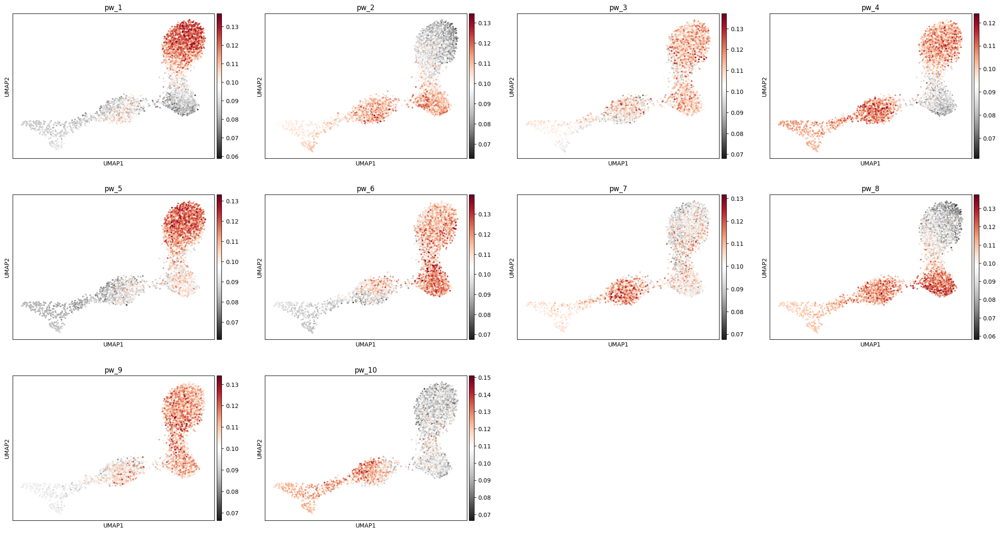

In [16]:
n_dynamics = model.transport_op.n_dynamics
sc.pl.embedding(
    adata_VAPOR,
    color=[f"pw_{i+1}" for i in range(n_dynamics)],
    basis="umap",
    cmap='RdGy_r',
)

In [19]:
UMAP_KEY = 'umap' # "umap": vapor latent space umap; "gex_umap": gene expression umap if a available

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi1_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi1_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


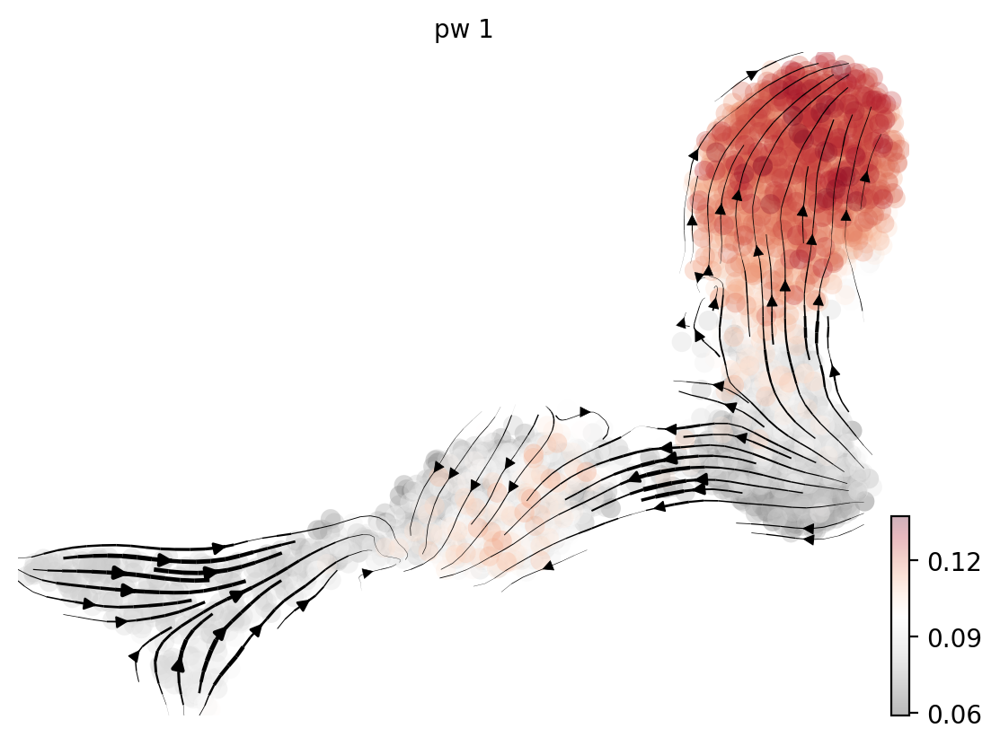

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi2_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi2_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


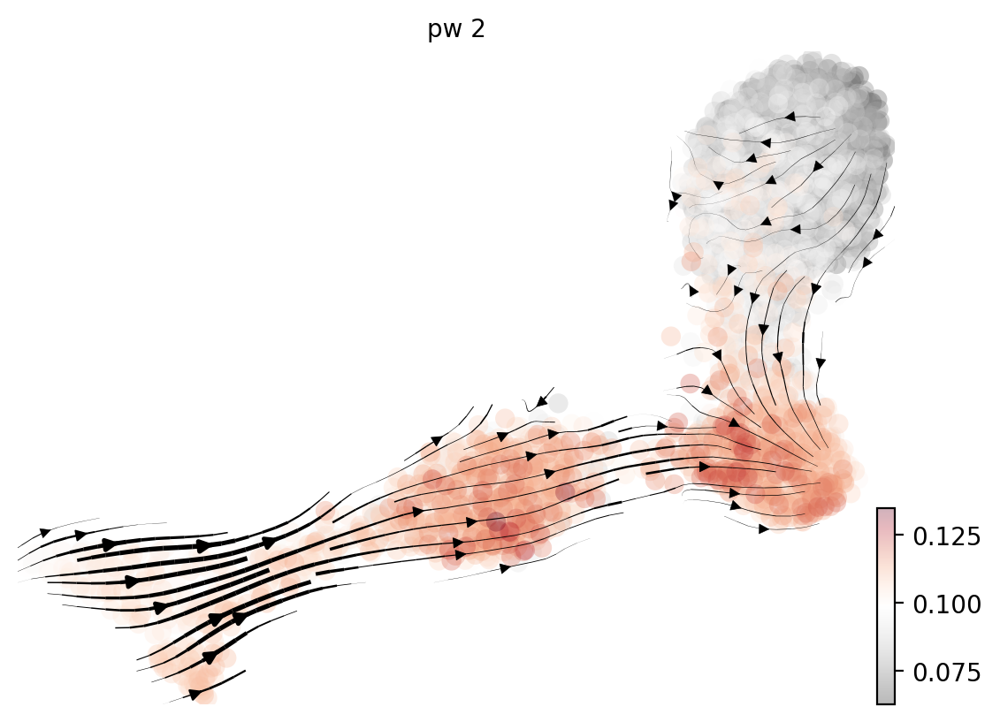

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi3_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi3_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


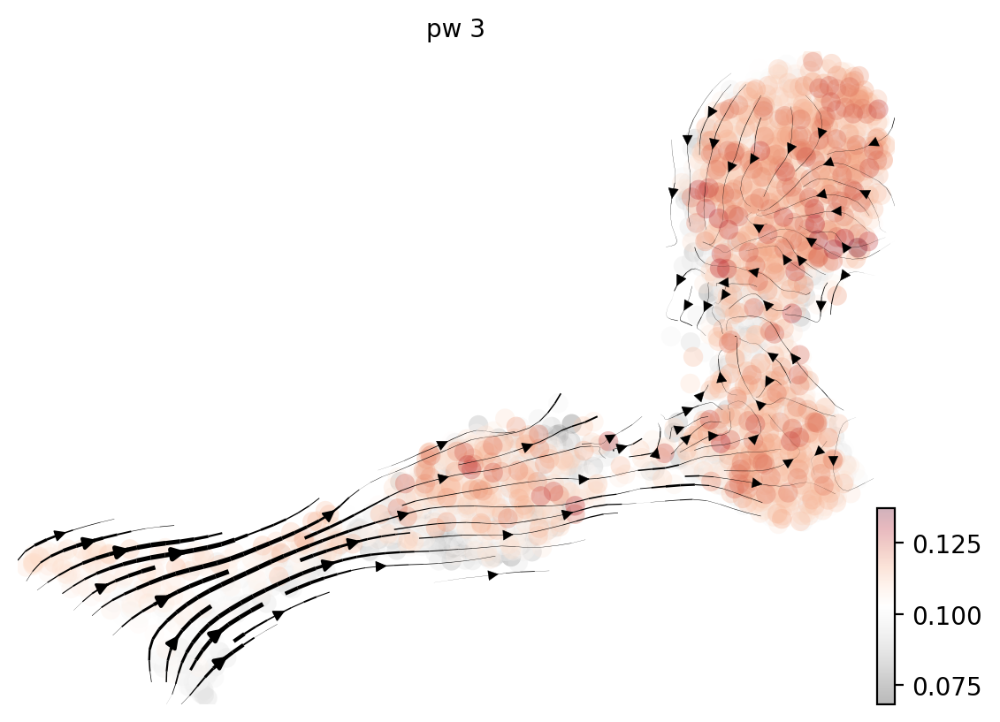

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi4_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi4_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


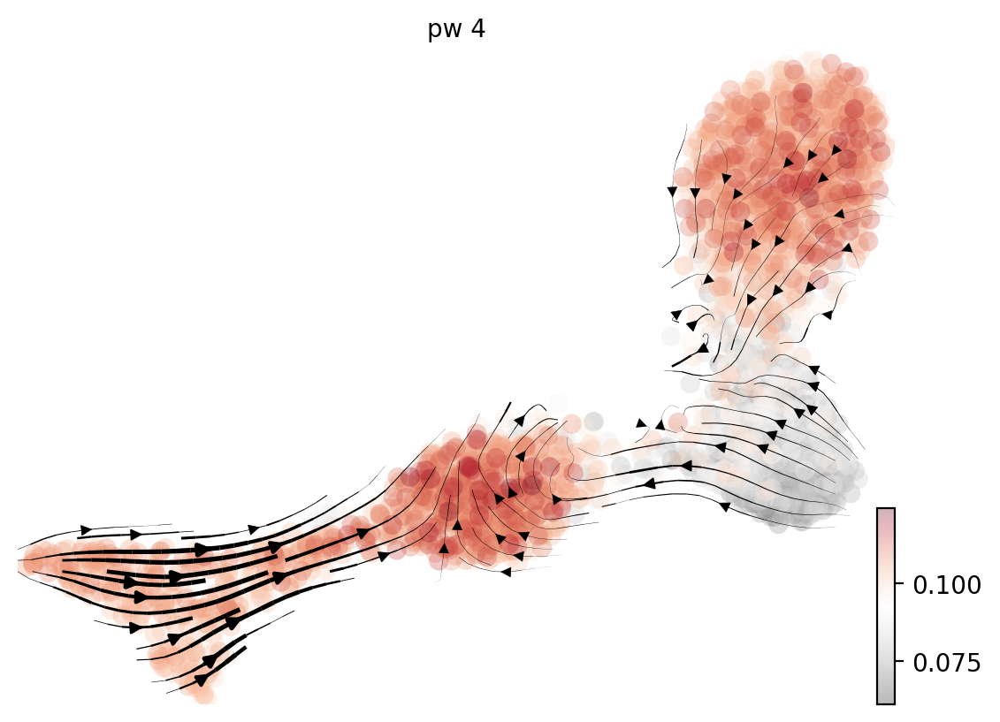

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi5_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi5_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


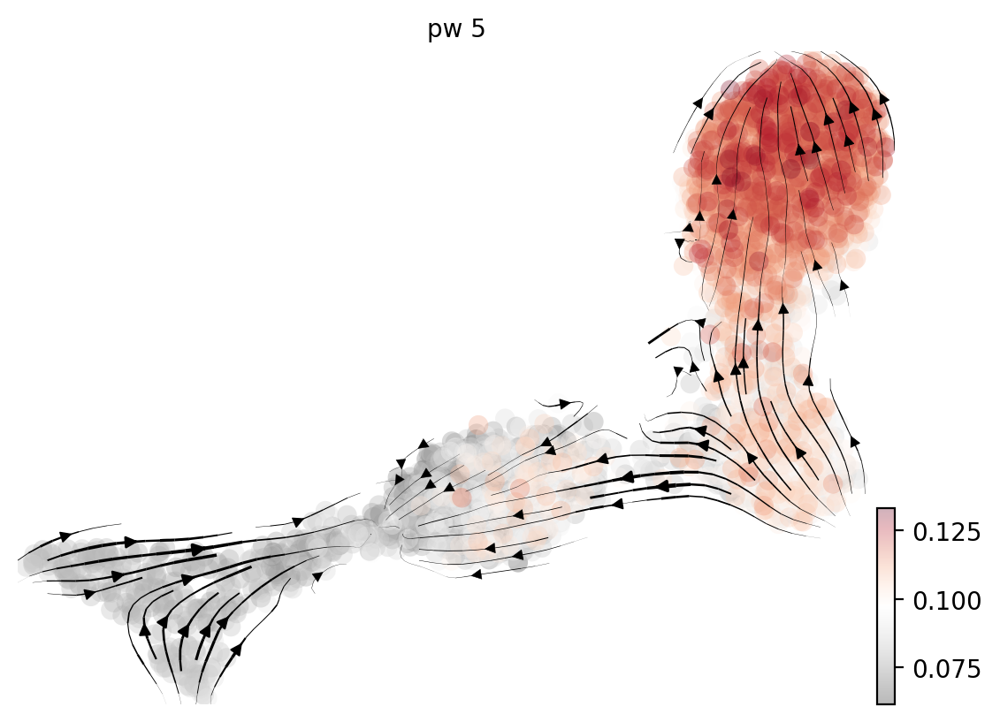

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi6_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi6_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


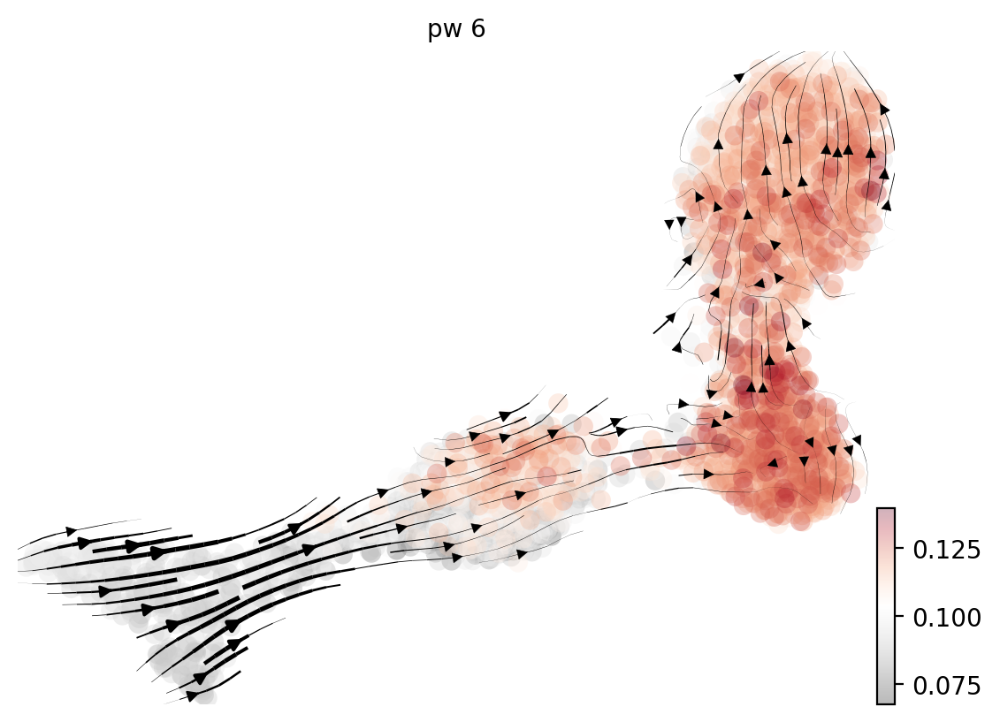

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi7_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi7_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


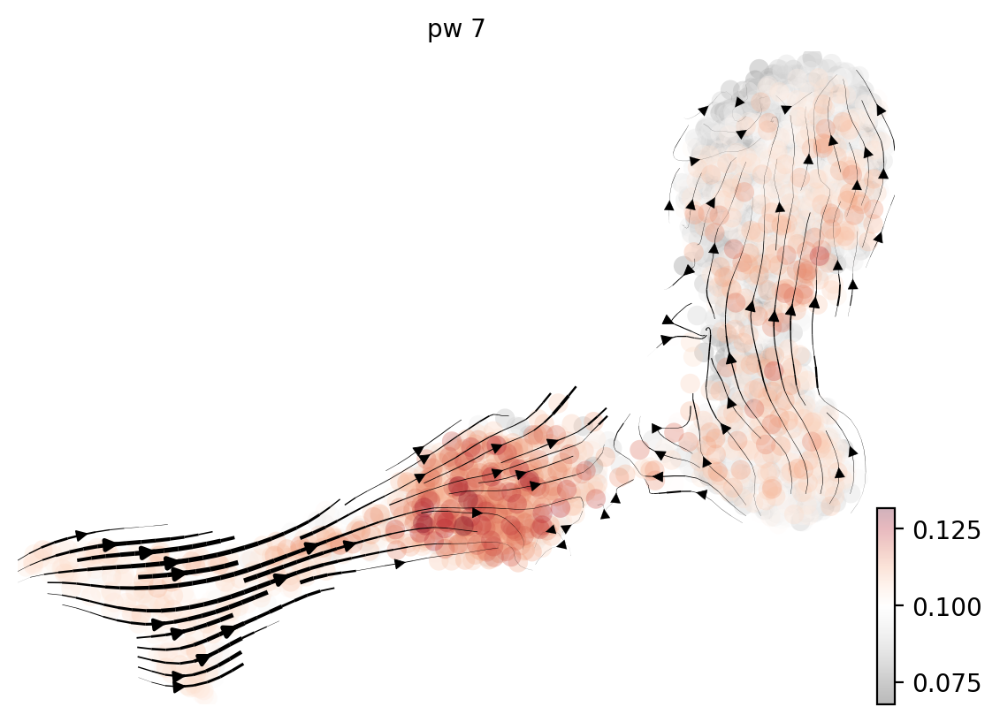

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi8_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi8_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


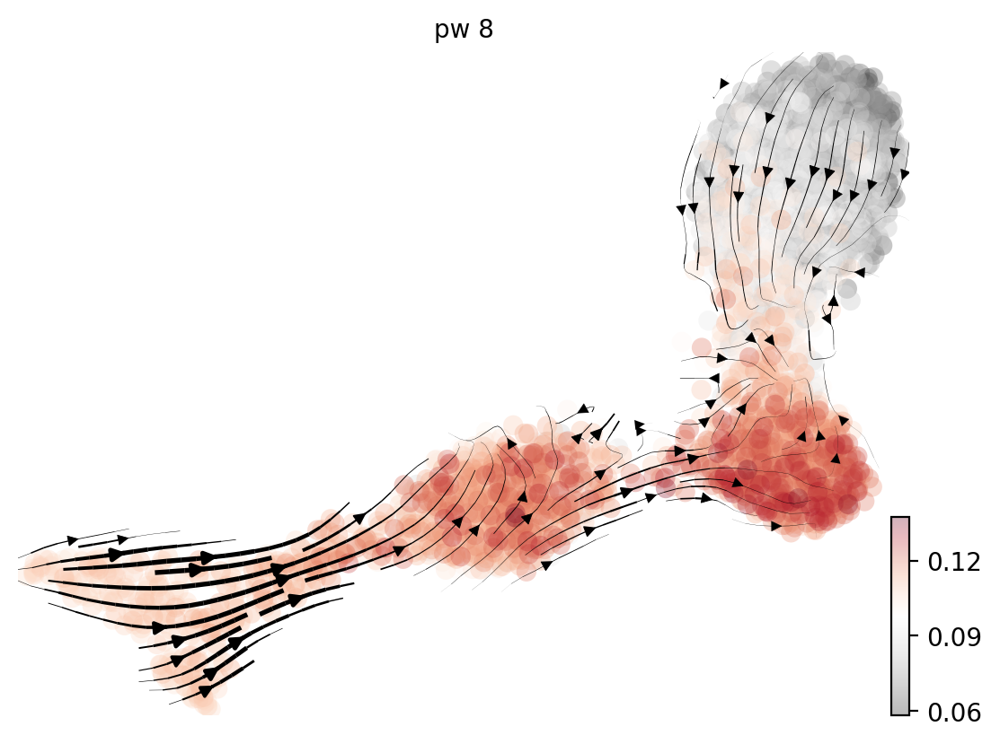

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi9_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi9_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


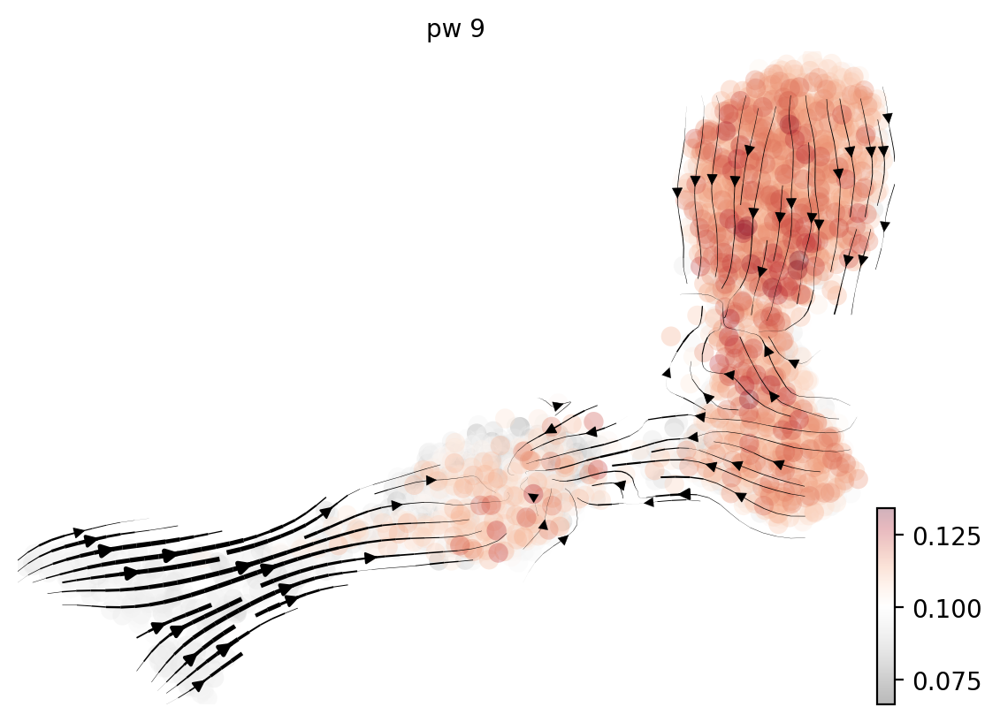

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'v_psi10_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'v_psi10_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


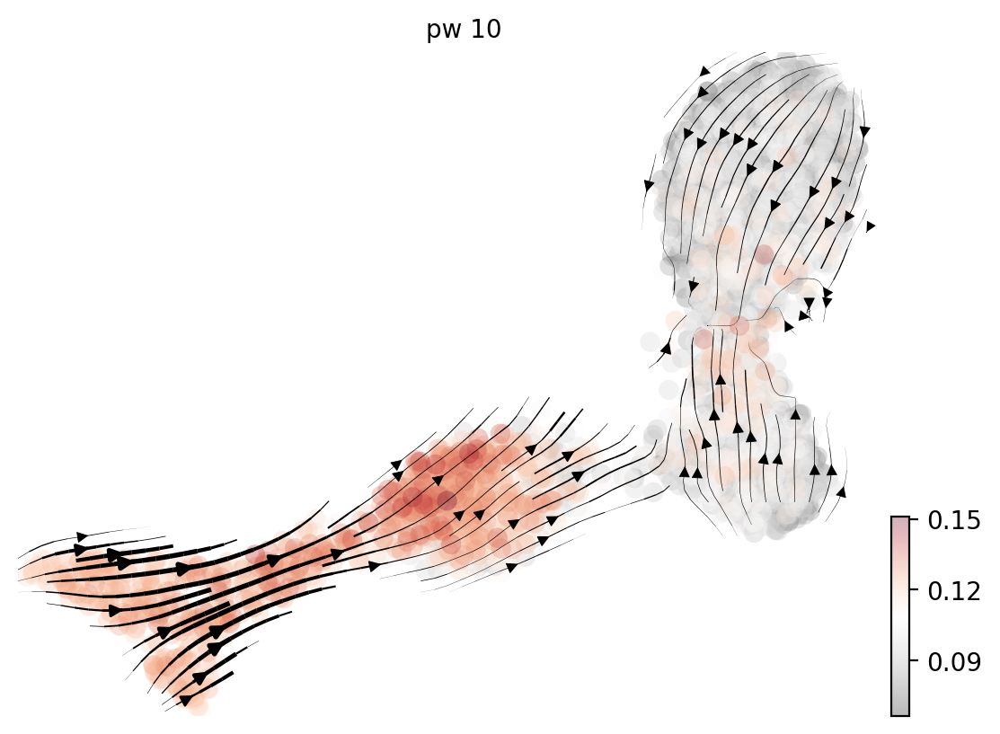

In [17]:
# Visualize on vapor latent space umap
for i in range(n_dynamics):
    sc.pp.neighbors(adata_VAPOR, use_rep='X_VAPOR', random_state=0, n_neighbors=n_neighbors)
    scv.tl.velocity_graph(adata_VAPOR, vkey=f'v_psi{i+1}', xkey='vapor')
    scv.pl.velocity_embedding_stream(
        adata_VAPOR,
        basis=UMAP_KEY,
        vkey=f'v_psi{i+1}',
        color=[f'pw_{i+1}'],
        cmap='RdGy_r',
        show=True,
        n_neighbors=50,
        dpi=200
    )

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi1_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


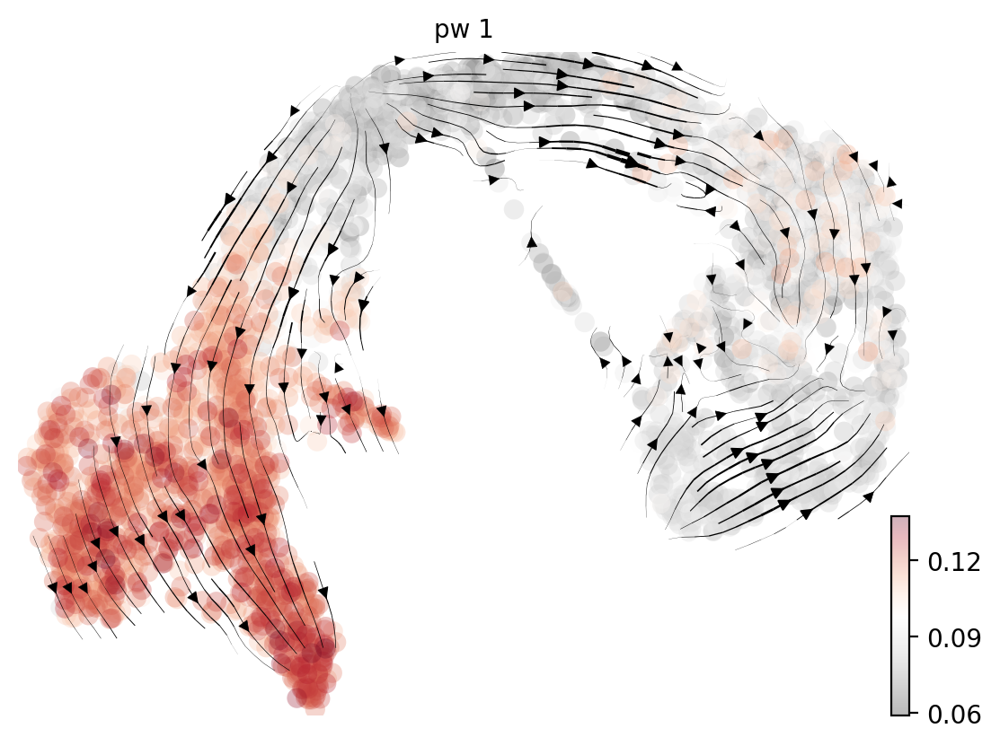

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi2_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


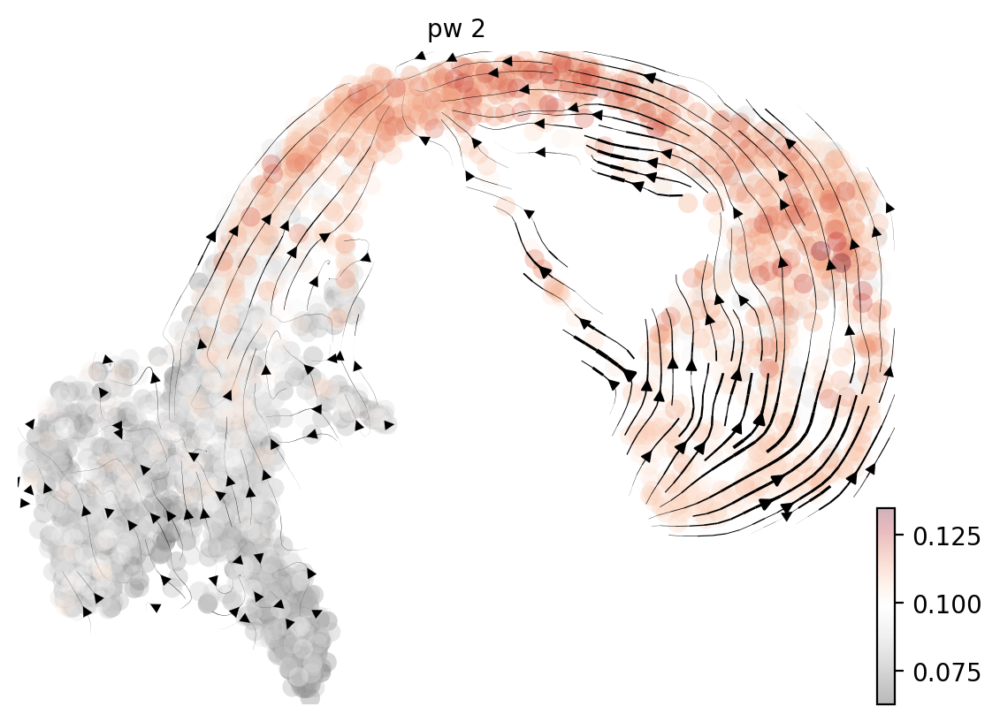

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi3_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


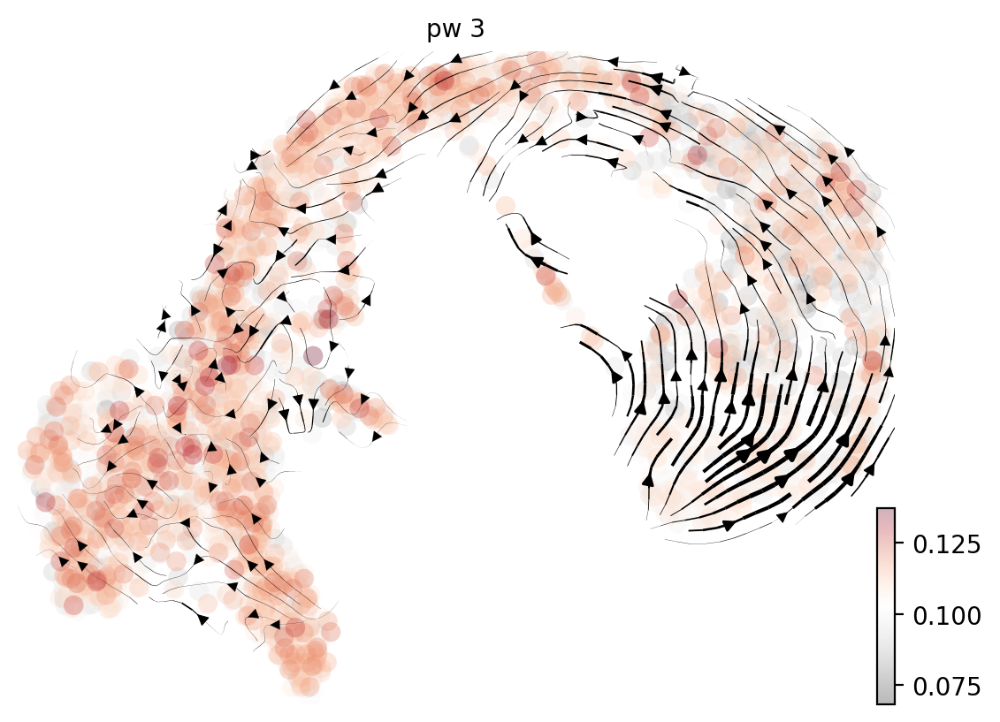

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi4_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


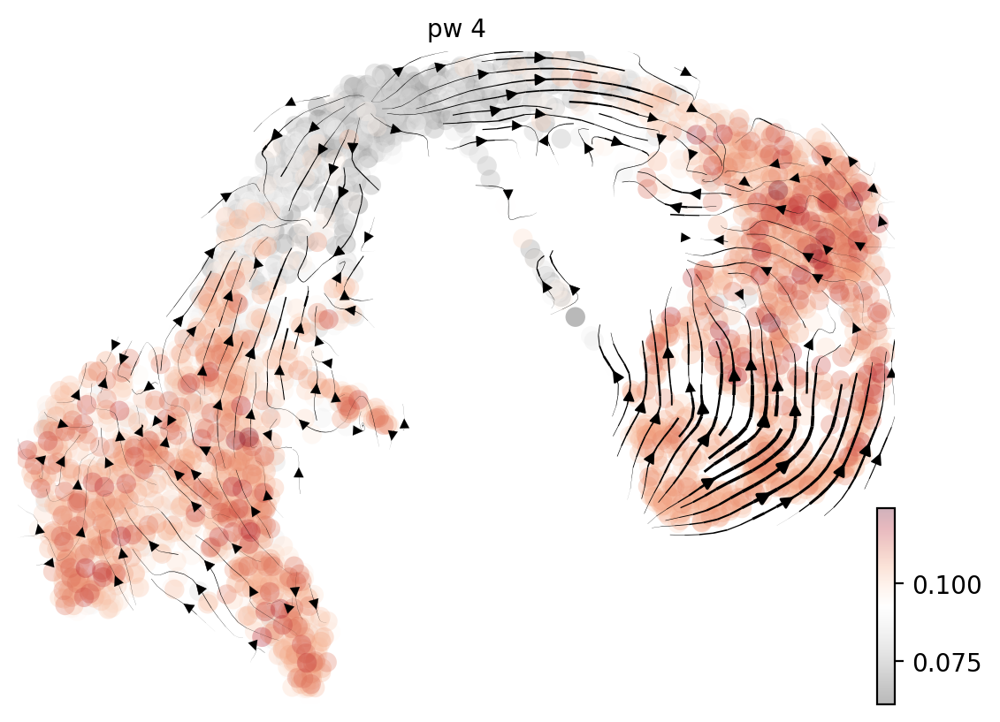

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi5_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


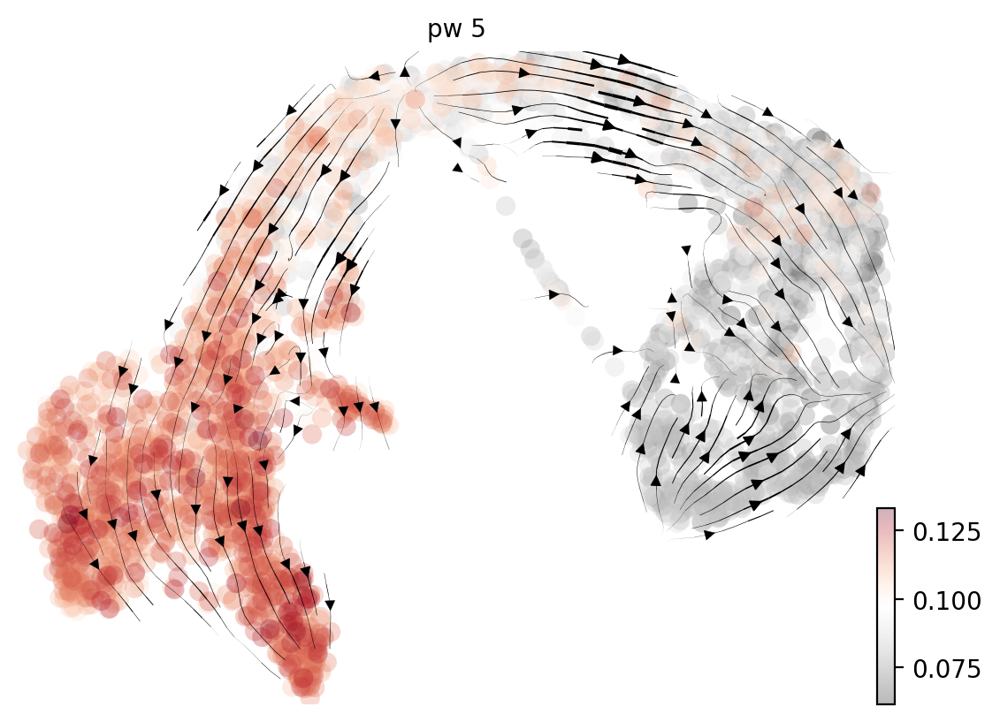

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi6_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


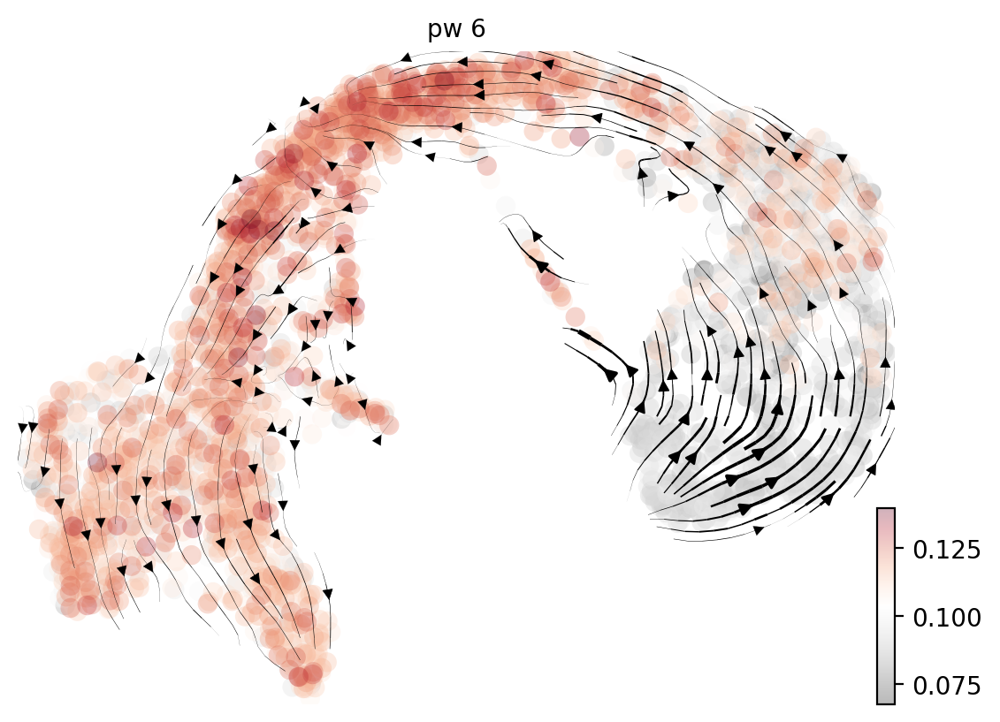

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi7_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


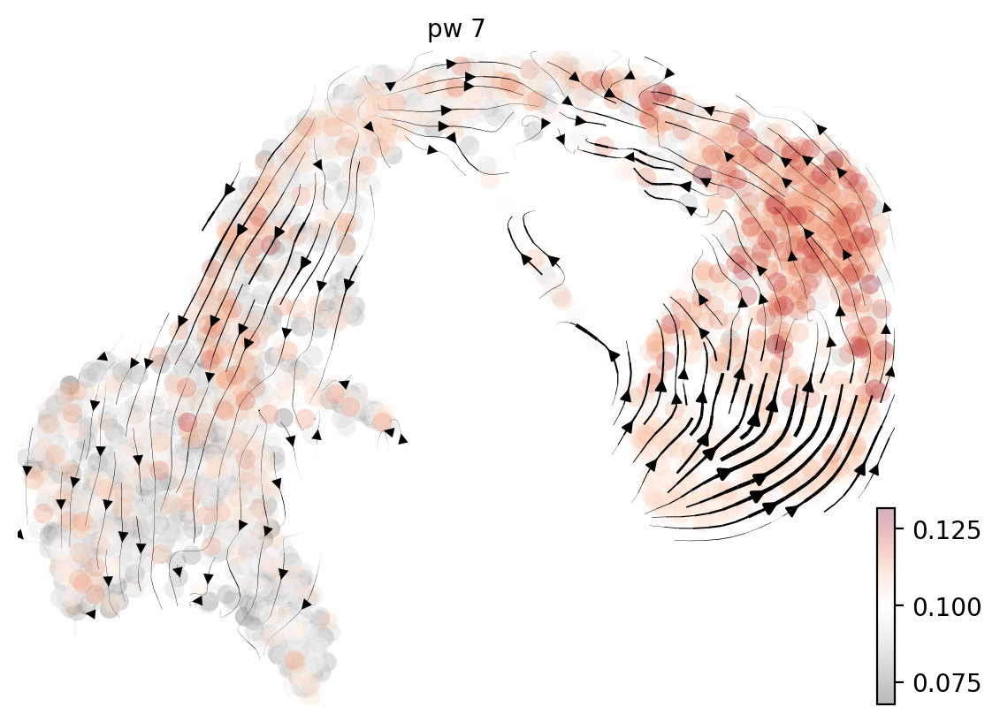

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi8_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


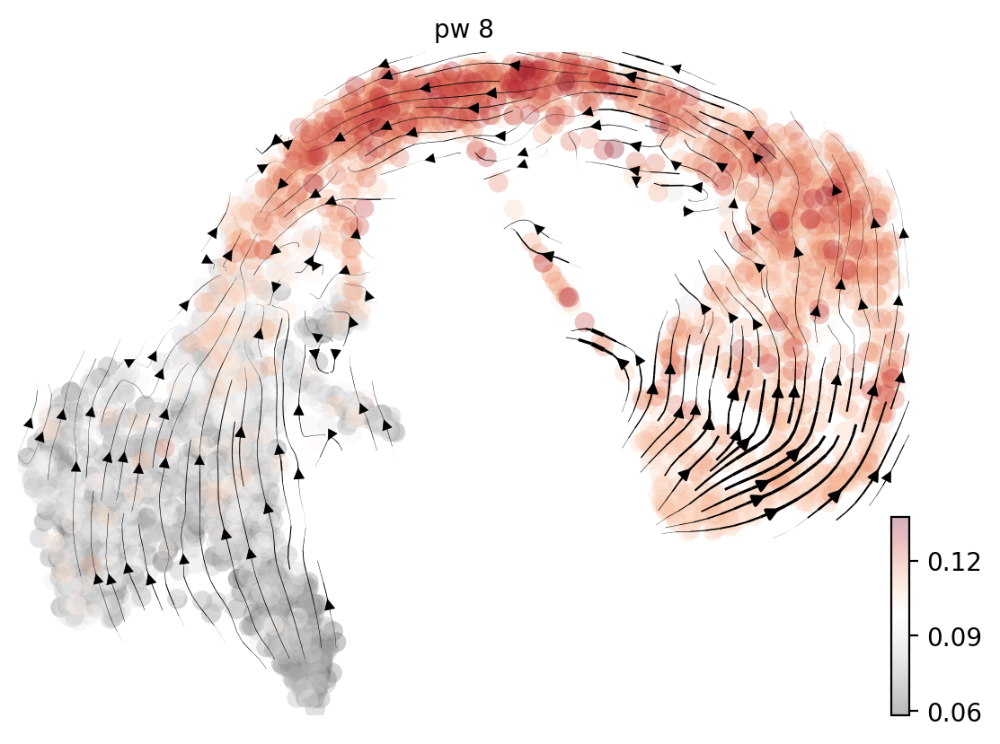

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi9_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


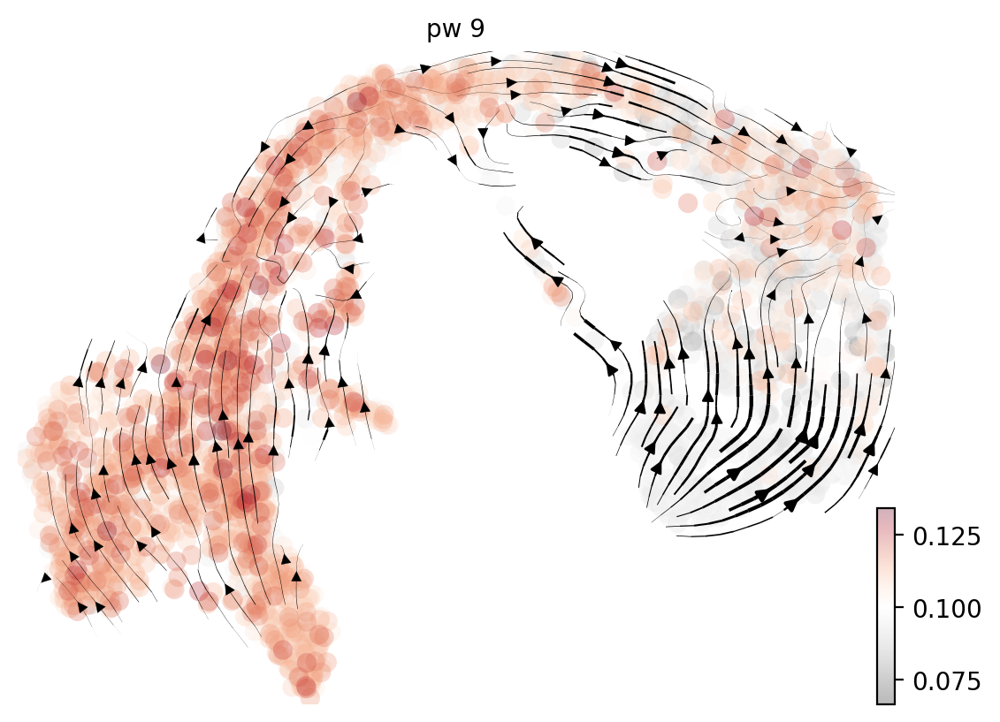

computing velocity embedding
    finished (0:00:00) --> added
    'v_psi10_gex_umap', embedded velocity vectors (adata.obsm)


/home/ubuntu/miniconda3/envs/vapor/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


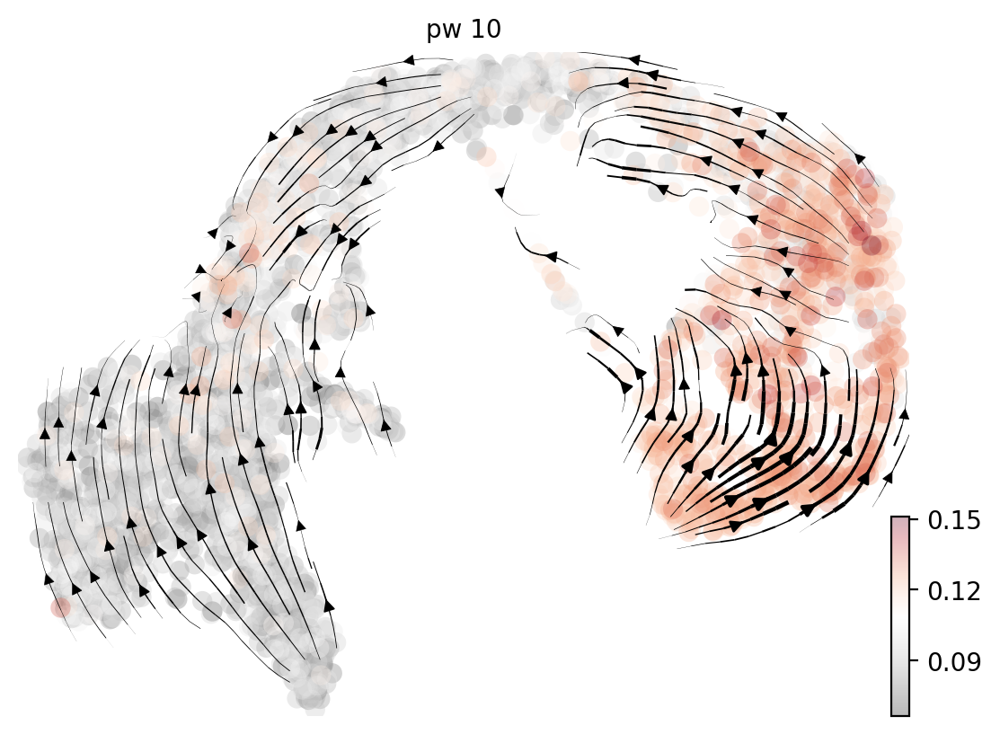

In [20]:
# Visualize on gene expression umap

for i in range(n_dynamics):
    # sc.pp.neighbors(adata_VAPOR, use_rep='X_VAPOR', random_state=0, n_neighbors=n_neighbors)
    # scv.tl.velocity_graph(adata_VAPOR, vkey=f'v_psi{i+1}', xkey='vapor')
    scv.pl.velocity_embedding_stream(
        adata_VAPOR,
        basis='gex_umap',
        vkey=f'v_psi{i+1}',
        color=[f'pw_{i+1}'],
        cmap='RdGy_r',
        show=True,
        n_neighbors=50,
        dpi=200
    )

### 4.3 Dynamic Gene Scores

In [21]:
adata_VAPOR = vapor.inference.directional_gene_scores_jvp_progress(
    trained_model,
    adata_VAPOR,
    batch_size=256,
    alpha = 1.0,
    tau_quantile = 0.6,)

Directional gene scoring:   0%|          | 0/194 [00:00<?, ?it/s]

In [22]:
import gseapy as gp

libs = gp.get_library_name(organism="Mouse")  # "Human"
[x for x in libs if x.startswith("GO_")][:50]

['GO_Biological_Process_2021',
 'GO_Biological_Process_2023',
 'GO_Biological_Process_2025',
 'GO_Cellular_Component_2021',
 'GO_Cellular_Component_2023',
 'GO_Cellular_Component_2025',
 'GO_Molecular_Function_2021',
 'GO_Molecular_Function_2023',
 'GO_Molecular_Function_2025']

In [23]:
enrichment_results = vapor.inferenc.run_enrichment(
    adata_VAPOR,
    psi_indices=None,     # all psi, or [1,2,3,...]
    gene_names=None,      # default from adata_VAPOR.uns
    select="pos",         # or "neg", or "both"
    top_n=150,            # top 100 genes
    organism="Mouse",
    gene_sets=(
        'GO_Biological_Process_2025',
        'GO_Cellular_Component_2025',
    ),
)

Running enrichment for psi1_pos (150 genes)
Running enrichment for psi2_pos (150 genes)
Running enrichment for psi3_pos (150 genes)
Running enrichment for psi4_pos (150 genes)
Running enrichment for psi5_pos (150 genes)
Running enrichment for psi6_pos (150 genes)
Running enrichment for psi7_pos (150 genes)
Running enrichment for psi8_pos (150 genes)
Running enrichment for psi9_pos (150 genes)
Running enrichment for psi10_pos (150 genes)


In [26]:
mat = vapor.inference.build_heatmap_mats(enrichment_results,
                                         top_n=7 # top n enriched terms
                                         )
for k, v in mat.items():
    vapor.inference.plot_heatmap(v, 'GO Enrichment (-log10 FDR)',
                                 figsize=(15, 20),cmap='viridis', cluster=True,col_cluster=False,
                                 zscore_rows=True, save=f'go_{k}_nodendro.png')